# Getting the data

First of all i combined the training data and testing data because in fast ai we can save a seperate data while training it . First i downloaded the data and combined it locally and i am running in colab . Easy way is upload in zip format and unzip in colab...

In [ ]:
!unzip "/content/drive/MyDrive/for kaggle.zip"

In [4]:
! [ -e /content ] && pip install -Uqq fastai 

     |████████████████████████████████| 186 kB 5.1 MB/s 
     |████████████████████████████████| 56 kB 5.0 MB/s 


## Importing necessary libraries...

In [5]:
from fastai.vision.all import *
from fastai.text.all import *
from fastai.collab import *
from fastai.tabular.all import * 

In [6]:
path = "/content/for kaggle/Train"


***Let's view a image***

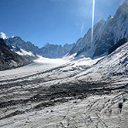

In [7]:
dest = '/content/for kaggle/Train/glacier/10.jpg'

im = Image.open(dest)
im.to_thumb(128,128)

In [8]:
clf = DataBlock(
 blocks=(ImageBlock, CategoryBlock),
 get_items=get_image_files,
 splitter=RandomSplitter(valid_pct=0.2, seed=42),
 get_y=parent_label,
 item_tfms=Resize(128))

In [9]:
dls = clf.dataloaders(path)

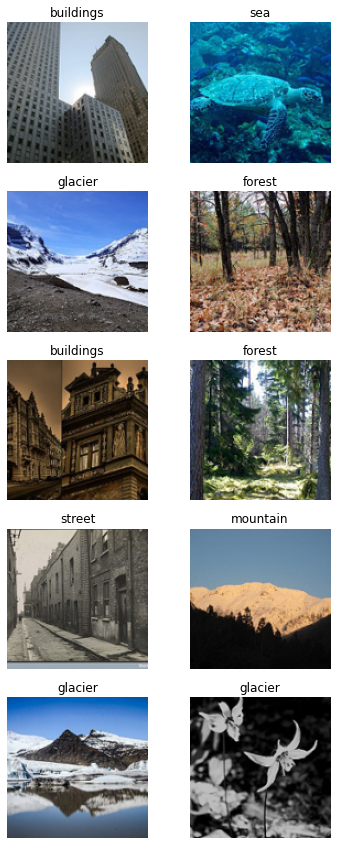

In [10]:
dls.valid.show_batch(max_n=10 , nrows = 5)

In [11]:
clf = clf.new(item_tfms=Resize(128, ResizeMethod.Squish))


In [14]:
dls = clf.dataloaders(path)

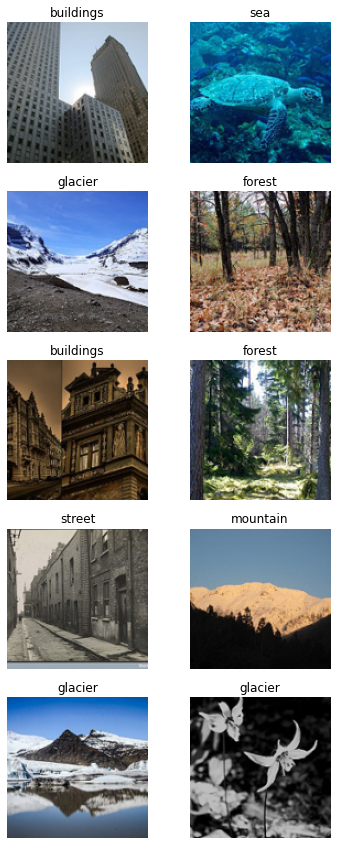

In [15]:
dls.valid.show_batch(max_n =10 , nrows = 5)

In [19]:
clf = clf.new(item_tfms=Resize(128, ResizeMethod.Pad,
pad_mode='zeros'))
dls = clf.dataloaders(path)



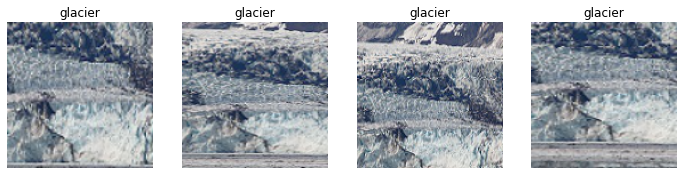

In [20]:

clf = clf.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = clf.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

**Data augmentation refers to creating random variations of our input data, such that
they appear different but do not change the meaning of the data**

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:1023: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  /pytorch/aten/src/ATen/native/BatchLinearAlgebra.cpp:760.)
  ret = func(*args, **kwargs)


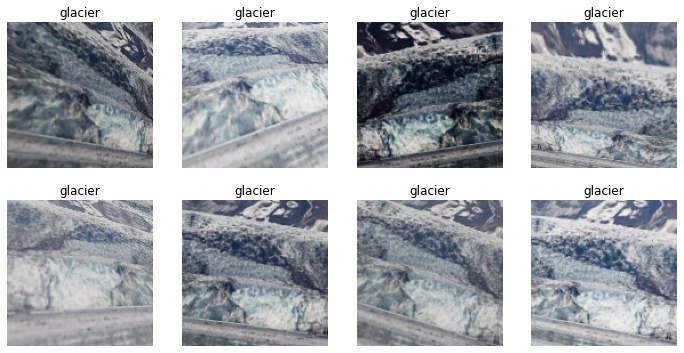

In [22]:
clf = clf.new(item_tfms = Resize(128),
                 batch_tfms = aug_transforms(mult=2))

dls = clf.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [23]:
clf = clf.new(item_tfms = RandomResizedCrop(224,min_scale = 0.5),
                 batch_tfms = aug_transforms())
dls = clf.dataloaders(path)

In [24]:

learn = cnn_learner(dls, resnet18, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [25]:
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.579822,0.330972,0.118908,01:05


epoch,train_loss,valid_loss,error_rate,time
0,0.366857,0.239334,0.088961,01:15
1,0.279777,0.209021,0.073987,01:14
2,0.216365,0.182302,0.064592,01:15
3,0.166347,0.185704,0.065179,01:14


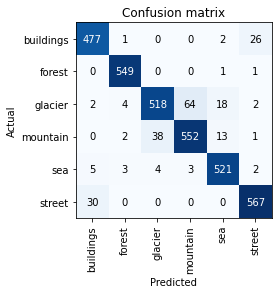

In [26]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

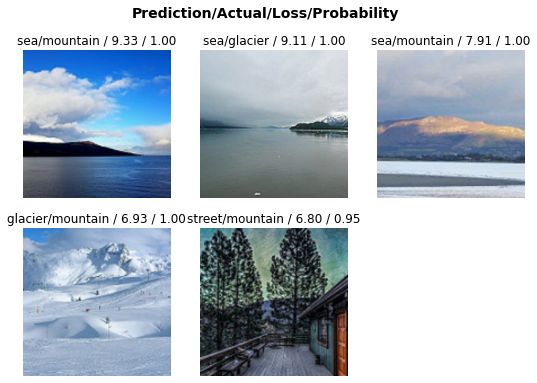

In [27]:
interp.plot_top_losses(5)

In [29]:
from fastai.vision.widgets import ImageClassifierCleaner 
cleaner = ImageClassifierCleaner(learn)
cleaner

In [30]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]),"/content/for kaggle/cat")


In [31]:
clf = clf.new(item_tfms = RandomResizedCrop(224,min_scale = 0.5),
                 batch_tfms = aug_transforms())
dls = clf.dataloaders(path)

learn = cnn_learner(dls, resnet18, metrics=error_rate)

In [32]:
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.567817,0.318692,0.104907,01:04


epoch,train_loss,valid_loss,error_rate,time
0,0.348055,0.261728,0.086982,01:15
1,0.279781,0.204757,0.070232,01:14
2,0.202211,0.183595,0.062592,01:14
3,0.157192,0.171566,0.059947,01:14


**Let's view a image and predict it to see if our model get's it right.**

In [37]:
learn.predict("/content/for kaggle/seg_pred/seg_pred/10054.jpg")

('glacier',
 tensor(2),
 tensor([4.1030e-06, 3.8164e-07, 9.8918e-01, 1.0818e-02, 2.8999e-07, 2.4876e-08]))

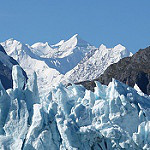

In [38]:
img = PILImage.create('/content/for kaggle/seg_pred/seg_pred/10054.jpg')
img

**It predicts well.**

*Let's create a function to make things easier.*

In [47]:
def predict(number):
  PILImage.create('/content/for kaggle/seg_pred/seg_pred/'+str(number)+'.jpg').show()
  return learn.predict('/content/for kaggle/seg_pred/seg_pred/'+str(number)+'.jpg')

('mountain',
 tensor(3),
 tensor([1.5266e-04, 1.1866e-03, 4.8251e-03, 9.8976e-01, 3.9908e-03, 8.7016e-05]))

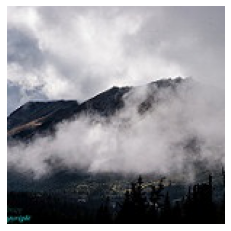

In [49]:
predict(11391)